In [140]:
## import libraries
import pandas as pd
import numpy as np 
import seaborn as sns 

from pandas.api.types import CategoricalDtype
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
import math
from fbprophet import Prophet
import plotly.express as px

In [68]:
##read_data
data=pd.read_csv("delhi_aqi.csv")

## first_five row 
data.head()

,date,co,no,no2,o3,so2,pm2_5,pm10,nh3
0,2020-11-25 01:00:00,2616.88,2.18,70.60,13.59,38.62,364.61,411.73,28.63
1,2020-11-25 02:00:00,3631.59,23.25,89.11,0.33,54.36,420.96,486.21,41.04
2,2020-11-25 03:00:00,4539.49,52.75,100.08,1.11,68.67,463.68,541.95,49.14
3,2020-11-25 04:00:00,4539.49,50.96,111.04,6.44,78.20,454.81,534.00,48.13
4,2020-11-25 05:00:00,4379.27,42.92,117.90,17.17,87.74,448.14,529.19,46.61


In [69]:
##change dtype
data['date']=pd.to_datetime(data['date'])

In [70]:
##set index as date 
data.set_index('date',inplace=True)

In [76]:
## add some columns 


cat_type= CategoricalDtype(categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'], ordered=True)

def create_features(data, label=None):
    """
    Creates time series features from datetime index
    """
    
    data1= data.copy()
    data['date']=data.index
    data['hour']=data['date'].dt.hour
    data['dayofweek']=data['date'].dt.dayofweek
    data['weekday']=data['date'].dt.day_name()
    data['weekday']=data['weekday'].astype(cat_type)
    data['quarter']=data['date'].dt.quarter
    data['month']=data['date'].dt.month
    data['year']=data['date'].dt.year
    data['dayofyear']=data['date'].dt.dayofyear
    data['dayofmonth']=data['date'].dt.day
    data['weekofyear']=data['date'].dt.weekofyear
    data['date_offset'] = (data.date.dt.month*100+data.date.dt.day -320)%1300
    
    X=data[['hour','dayofweek','quarter','month','year','dayofyear','dayofmonth','weekofyear','weekday']]
    return X

X= create_features(data)
all_data= pd.concat([X,data],axis=1)

C:\Users\kabir\AppData\Local\Temp\ipykernel_7824\4138472124.py:21: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



In [77]:
## adding season column 
season_month_north={
    12:'winter',1:'winter',2:'winter',
    3:'spring',4:'summer',5:'summer',
    6:'summer',7:'moonsoon',8:'moonsoon',
    9:'autumn',10:'autumn',11:'autumn'
}
data['seasons']=data['month'].map(season_month_north)

# EDA

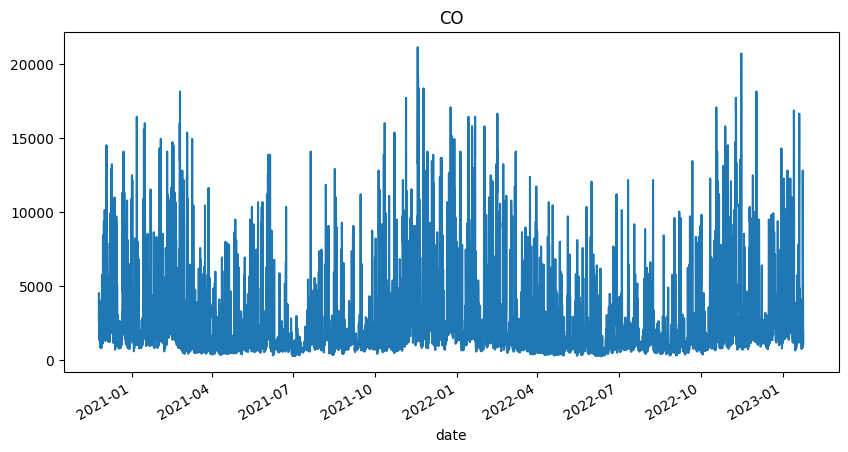

In [78]:
plt.figure(figsize=(15,10))
color_pal=sns.color_palette()
data['co'].plot(style='-',figsize=(10,5),
                     ms=1,
                     color=color_pal[0],
                     title='CO')
plt.show()

In [79]:
fig = px.ecdf(data, x=data.index,y='co')
fig.show()

as we seen above that co is incresase day by day 

# Now we cheak pm2_5 with seasons

In [80]:
fig = px.ecdf(data, x="pm2_5", color="seasons")
fig.show()

In [81]:
fig = px.histogram(data, x="weekday", y="pm2_5", color="seasons", marginal="rug", hover_data=data.columns)
fig.show()

# Monthly pm2_5 concentration trend

<AxesSubplot: xlabel='month', ylabel='pm2_5'>

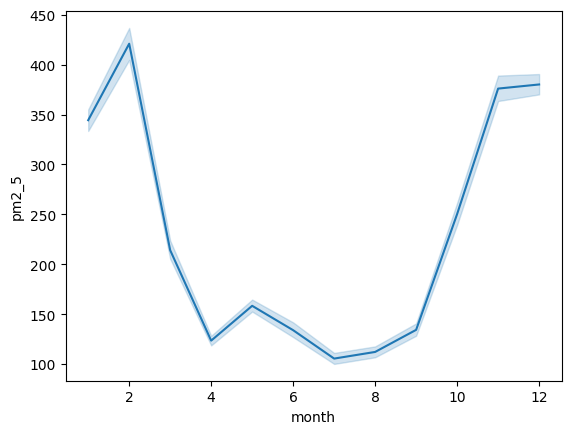

In [83]:
sns.lineplot(data=data,x='month',y='pm2_5')

# seasons seasonality pm2_5 trnd

<AxesSubplot: xlabel='seasons', ylabel='pm2_5'>

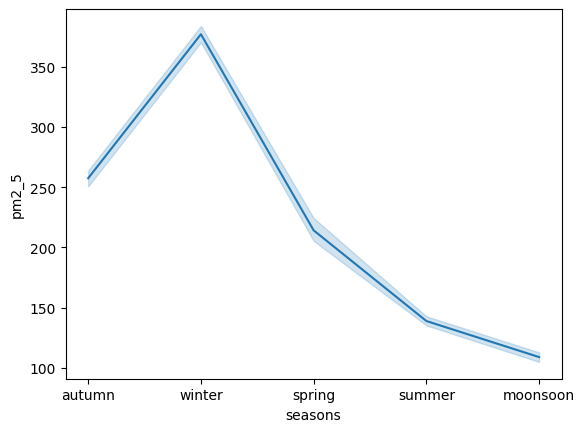

In [84]:
sns.lineplot(data=data,x='seasons',y='pm2_5')

# Hour pm2 concentration trend 

<AxesSubplot: xlabel='hour', ylabel='pm2_5'>

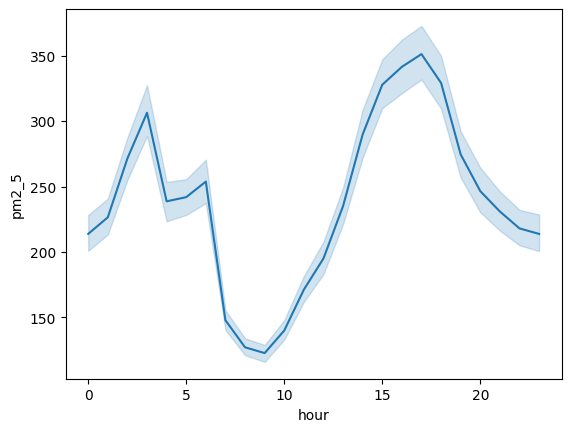

In [85]:
sns.lineplot(data=data,x='hour',y='pm2_5')

<AxesSubplot: >

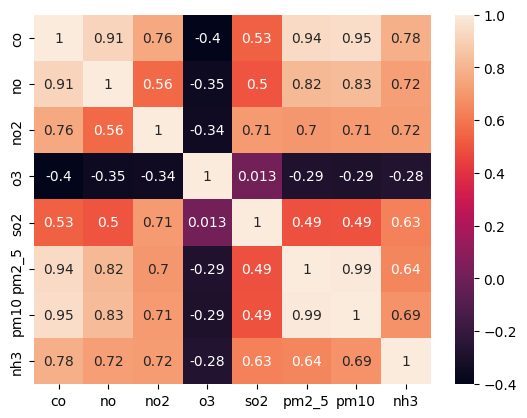

In [86]:
##heatmap
sns.heatmap(data[['co','no','no2','o3','so2','pm2_5','pm10','nh3']].corr(),annot=True)

# Modeling 

In [137]:
#Data prepration 
model_data=data[['pm2_5']]
model_data.reset_index(inplace=True)
model_data['date']=model_data['date'].dt.date
model_data['date']=pd.to_datetime(model_data.date)
model_data.drop_duplicates(inplace=True)

C:\Users\kabir\AppData\Local\Temp\ipykernel_7824\832902730.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kabir\AppData\Local\Temp\ipykernel_7824\832902730.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kabir\AppData\Local\Temp\ipykernel_7824\832902730.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [148]:
#3 divide data in x and y 
n_split=3

x=model_data['date']
y=model_data['pm2_5']
X=x
folds=TimeSeriesSplit(n_splits=n_slit)

In [153]:
## convert data into train and test 
train_size = int(0.85 * len(model_data))
test_size = len(model_data) - train_size

univariate_df = model_data[['date', 'pm2_5']].copy()
univariate_df.columns = ['ds', 'y']
train = univariate_df.iloc[:train_size, :]

x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

print(len(train), len(x_valid))

15948 2815


In [160]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

model = pm.auto_arima(y_train, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=175966.586, Time=1.48 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=228781.216, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=178055.840, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=209159.110, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=175876.369, Time=2.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=176040.518, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=175595.911, Time=2.36 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=176041.449, Time=0.34 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=175483.747, Time=4.23 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=175748.997, Time=2.50 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=174740.658, Time=5.72 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=174859.102, Time=4.84 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=174308.106, Time=13.79 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=174373.520, Time=9.97 sec
 ARI

As we saw in the previous Steps, AutoARIMA (auto_arima) validates that (0,0,0) is the best configuration for (p,d,q)

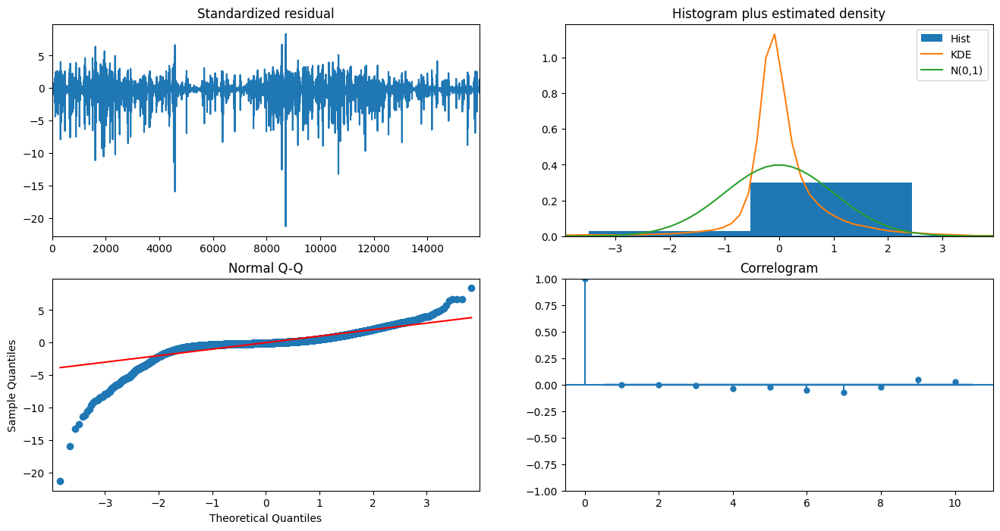

In [161]:
model.plot_diagnostics(figsize=(16,8))
plt.show()

So how to interpret the plot diagnostics?

Top left: The residual errors seem to fluctuate around a mean of zero and have a uniform variance between (-4, 4).

Top Right: The density plot suggest normal distribution with mean zero.

Bottom left: The most part of the blue dots are over the red line, so it seems that the distribution in very low skewed (not skewed for me).

Bottom Right: The Correlogram, aka, ACF plot shows the residual errors are not autocorrelated.


